In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'inference', 'q3421_mapped_preds_clusters.csv')
feats_loc = os.path.join(path, 'data', 'features', 'q3421_local_mapped_feats.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

db = pd.read_csv(preds_loc, index_col=0)
db_feats = db[[c for c in db.columns if not 'runtime' in c and not 'dir' in c]]
db_ddg = db[['ddG']]
db_cluster = db[['cluster']]
db_training = db[[c for c in db.columns if 'overlaps' in c]]
#db = db.dropna(how='any', axis=1)

db['uid2'] = db['code'] + '_' + db['position'].astype(str) + db['mutation']
db = db.reset_index().set_index(['uid', 'uid2'])

db_preds = db[[c for c in db.columns if 'dir' in c 
    and not 'runtime' in c and not 'pll' in c]]
db_runtimes = db[[c for c in db.columns if 'runtime' in c]]
db_runtimes['runtime_korpm_dir'] = 0.0015
db_runtimes['runtime_korpm'] = 0.0015

# load effective number of sequences from separate file (generated by MSA transformer)
neff = pd.read_csv(os.path.join(path, 'data', 'features', 'neff_Q3421.csv'), header=None).set_index(0)
neff.index.name = 'code'
neff.columns = ['neff', 'sequence_length_up']
neff = neff.groupby(level=0).max()
neff

,neff,sequence_length_up
code,,
1A0F,11312.451628,201
1A0N,178.989797,724
1A23,13891.844474,208
1A32,5760.263634,89
1A43,9.152420,1435
...,...,...
7JJK,22.713092,753
7MSI,15493.812704,66
8AME,15493.812704,66


In [2]:
# Get predictions from Rosetta (included in repo, NEED TO DOWNLOAD WITH GIT LFS AND UNZIP)
# assuming you have designated the repo location as the path
# the predictions are already included so only run this if you want to regenerate them
"""
df_cart, df_cart_runtimes = analysis_utils.parse_rosetta_predictions(db.reset_index('uid', drop=True).reset_index().rename({'uid2': 'uid'}, axis=1).set_index('uid'), os.path.join(path, 'data', 'rosetta_predictions'), runtime=True)
db_preds = db_preds.reset_index().rename({'uid': 'uid_', 'uid2': 'uid'}, axis=1).set_index('uid').join(df_cart.astype(float).rename_axis('uid'), how='left')
db_preds = db_preds.reset_index(drop=True).rename({'uid_': 'uid'}, axis=1).set_index('uid')
db_runtimes = db_runtimes.reset_index('uid').join(df_cart_runtimes.astype(float), how='left')

db_mod = db.copy(deep=True)
db_mod = db_mod.reset_index().rename({'uid': 'uid_', 'uid2': 'uid'}, axis=1).set_index('uid').join(df_cart.astype(float).rename_axis('uid'), how='left')
db_mod = db_mod.join(db_runtimes[['runtime_cartesian_ddg_dir']], how='left').reset_index(drop=True).rename({'uid_': 'uid'}, axis=1).set_index('uid')
db_mod.to_csv(preds_loc)
"""
# ~10 seconds on SSD, 5 minutes on HDD

"\ndf_cart, df_cart_runtimes = analysis_utils.parse_rosetta_predictions(db.reset_index('uid', drop=True).reset_index().rename({'uid2': 'uid'}, axis=1).set_index('uid'), os.path.join(path, 'data', 'rosetta_predictions'), runtime=True)\ndb_preds = db_preds.reset_index().rename({'uid': 'uid_', 'uid2': 'uid'}, axis=1).set_index('uid').join(df_cart.astype(float).rename_axis('uid'), how='left')\ndb_preds = db_preds.reset_index(drop=True).rename({'uid_': 'uid'}, axis=1).set_index('uid')\ndb_runtimes = db_runtimes.reset_index('uid').join(df_cart_runtimes.astype(float), how='left')\n\ndb_mod = db.copy(deep=True)\ndb_mod = db_mod.reset_index().rename({'uid': 'uid_', 'uid2': 'uid'}, axis=1).set_index('uid').join(df_cart.astype(float).rename_axis('uid'), how='left')\ndb_mod = db_mod.join(db_runtimes[['runtime_cartesian_ddg_dir']], how='left').reset_index(drop=True).rename({'uid_': 'uid'}, axis=1).set_index('uid')\ndb_mod.to_csv(preds_loc)\n"

In [3]:
# extract existing features from FireProtDB
feats = ['T', 'pH', 'is_nmr']

# get only unique mutations
db_feats = db[feats]

# load features generated by preprocessing/compute_features.py
generated_feats = pd.read_csv(feats_loc)

# preprocess raw features
generated_feats['uid'] = generated_feats['code'] + '_' + generated_feats['position'].astype(str) + generated_feats['mutation']
generated_feats = generated_feats.set_index('uid')

generated_feats = generated_feats[[
       'code', 'wild_type', 'mutation', 'on_interface', 'entropy', 
       'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 
       'structure_length', 'sequence_length','multimer', 'SS','features', 
       'hbonds', 'saltbrs', 'kdh_wt', 'kdh_mut', 'vol_wt', 
       'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', #'residue_depth',
       ]]

# combine generated features with features provided by Q3421 authors
db_feats_2 = generated_feats.join(db_feats.reset_index('uid'), how='inner')
db_feats_2 = db_feats_2.reset_index(drop=True).set_index('uid')

# derived from SwissProt
db_feats_2['on_interface'] = db_feats_2['on_interface'] #.astype(int)
db_feats_2['features'] = db_feats_2['features'].fillna("")
db_feats_2['binding'] = db_feats_2['features'].str.contains('BINDING')
db_feats_2['active_site'] = db_feats_2['features'].str.contains('ACT_SITE')

# change in physicochemical features
db_feats_2['delta_kdh'] = db_feats_2['kdh_mut'] - db_feats_2['kdh_wt']
db_feats_2['delta_vol'] = db_feats_2['vol_mut'] - db_feats_2['vol_wt']
db_feats_2['delta_chg'] = db_feats_2['chg_mut'] - db_feats_2['chg_wt']

db_feats_2['delta_kdh_dir'] = db_feats_2['kdh_mut'] - db_feats_2['kdh_wt']
db_feats_2['delta_vol_dir'] = db_feats_2['vol_mut'] - db_feats_2['vol_wt']
db_feats_2['delta_chg_dir'] = db_feats_2['chg_mut'] - db_feats_2['chg_wt']
db_feats_2['rel_ASA_dir'] = db_feats_2['rel_ASA']

# unusual / important identities
db_feats_2['to_proline'] = db_feats_2['mutation'] == 'P'
db_feats_2['to_glycine'] = db_feats_2['mutation'] == 'G'
db_feats_2['from_proline'] = db_feats_2['wild_type'] == 'P'
db_feats_2['from_glycine'] = db_feats_2['wild_type'] == 'G'
db_feats_2['to_alanine'] = db_feats_2['mutation'] == 'A'

# secondary structure
db_feats_2['helix'] = db_feats_2['SS'] == 'H'
db_feats_2['bend'] = db_feats_2['SS'] == 'S'
db_feats_2['turn'] = db_feats_2['SS'] == 'T'
db_feats_2['coil'] = db_feats_2['SS'] == '-'
db_feats_2['strand'] = db_feats_2['SS'] == 'E'

# drop raw features
db_feats_2 = db_feats_2.drop([
       'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 
       'features', 'SS', 'wild_type', 'mutation'
       ], axis=1)

db_feats_2 = db_feats_2.rename({'T': 'TEMP'}, axis=1)
db_feats_2
# combine feature information from remaining sources
db_feats_2 = db_feats_2.reset_index().merge(neff, on='code', how='left').drop('code', axis=1).set_index('uid')
#db_feats_2 = db_feats_2.join(db_measurements[['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor']])
#print(len(db_feats_2))
#db_feats_2['ProTherm']
db_feats_2

,on_interface,entropy,conservation,column_completeness,completeness_score,n_seqs,structure_length,sequence_length,multimer,hbonds,...,from_proline,from_glycine,to_alanine,helix,bend,turn,coil,strand,neff,sequence_length_up
uid,,,,,,,,,,,,,,,,,,,,,
1A23_30S,False,0.081626,98.824080,0.999844,0.857849,19219.0,189,208.0,1,0.0,...,False,False,False,False,True,False,False,False,13891.844474,208.0
1A23_32L,False,1.872407,33.373224,0.999896,0.857849,19219.0,189,208.0,1,2.0,...,False,False,False,True,False,False,False,False,13891.844474,208.0
1A23_32S,False,1.872407,33.373224,0.999896,0.857849,19219.0,189,208.0,1,2.0,...,False,False,False,True,False,False,False,False,13891.844474,208.0
1A23_32Y,False,1.872407,33.373224,0.999896,0.857849,19219.0,189,208.0,1,2.0,...,False,False,False,True,False,False,False,False,13891.844474,208.0
1A23_33S,False,0.110752,98.163276,0.999896,0.857849,19219.0,189,208.0,1,1.0,...,False,False,False,True,False,False,False,False,13891.844474,208.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,False,1.902107,1.154930,1.000000,0.849680,3550.0,60,66.0,2,1.0,...,False,False,False,False,False,False,True,False,2413.231303,66.0
5CRO_26Q,False,1.902107,1.154930,1.000000,0.849680,3550.0,60,66.0,2,1.0,...,False,False,False,False,False,False,True,False,2413.231303,66.0
5CRO_26V,False,1.902107,1.154930,1.000000,0.849680,3550.0,60,66.0,2,1.0,...,False,False,False,False,False,False,True,False,2413.231303,66.0


Detected 179 interface mutations


,esmif_monomer_dir,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_dir,esm2_15B_half_dir,msa_1_dir,...,evolutionary_dir,supervised_dir,clustered_ensemble_dir,mpnn_rosetta_dir,mpnn_oracle_dir,cartesian_oracle_dir,mpnn_mean_dir,esmif_mean_dir,mif_mean_dir,esm2_mean_dir
uid,,,,,,,,,,,,,,,,,,,,,
1A23_30S,-0.043713,1.864485,-6.805952,2.161112,2.015380,-1.341709,-0.043713,-11.571676,-11.668701,-8.661992,...,-2.639685,-0.287875,-1.049327,0.447913,1.595380,-1.987467,0.944928,-0.043713,-2.470734,-10.243093
1A23_32L,-0.042389,1.119251,-7.800102,0.124216,1.953414,-0.178574,-0.042389,-13.755667,-13.076172,-8.351897,...,-2.407763,0.368115,-0.742697,3.727081,2.481414,2.301667,0.633019,-0.042389,-3.340426,-11.020145
1A23_32S,-0.029983,-0.854073,-5.414868,0.415694,0.718097,0.932330,-0.029983,-8.291791,-10.436035,-6.135631,...,-1.388348,-0.246144,-0.619945,-1.480236,0.548097,-2.368333,0.688707,-0.029983,-3.134470,-6.979515
1A23_32Y,-0.020219,1.528646,-3.414633,-0.015509,0.628828,0.250166,-0.020220,-8.121881,-9.415039,-4.844220,...,-1.398277,0.598820,-0.297692,1.395828,1.360828,1.499000,0.287828,-0.020220,-0.942993,-6.545897
1A23_33S,-0.024960,0.348253,-5.093968,1.232823,-0.549477,0.841176,-0.024960,-12.002896,-12.722168,-7.209576,...,-2.155269,-0.510965,-0.984931,0.244857,-1.705477,-0.361667,0.508174,-0.024960,-2.372857,-10.213092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,-0.037373,-0.438132,-0.126320,0.094636,0.362146,0.098527,-0.038054,-3.150103,-2.374512,-0.849762,...,-0.605536,0.068590,-0.239242,2.591146,0.990146,2.857000,0.185103,-0.037713,-0.282226,-1.335384
5CRO_26Q,-0.004605,0.140129,0.700469,1.785023,1.177964,1.794943,-0.006247,-2.508844,-2.625244,0.924675,...,-0.173227,0.308748,0.132020,2.882964,2.098964,2.626000,1.585977,-0.005426,0.420299,-0.621196
5CRO_26V,0.037691,0.501243,1.538724,1.421123,0.969365,0.458124,0.032355,-3.204980,-2.228027,-1.276998,...,-0.526999,0.065966,-0.017045,2.105365,1.482365,1.649000,0.949538,0.035023,1.019984,-0.953246


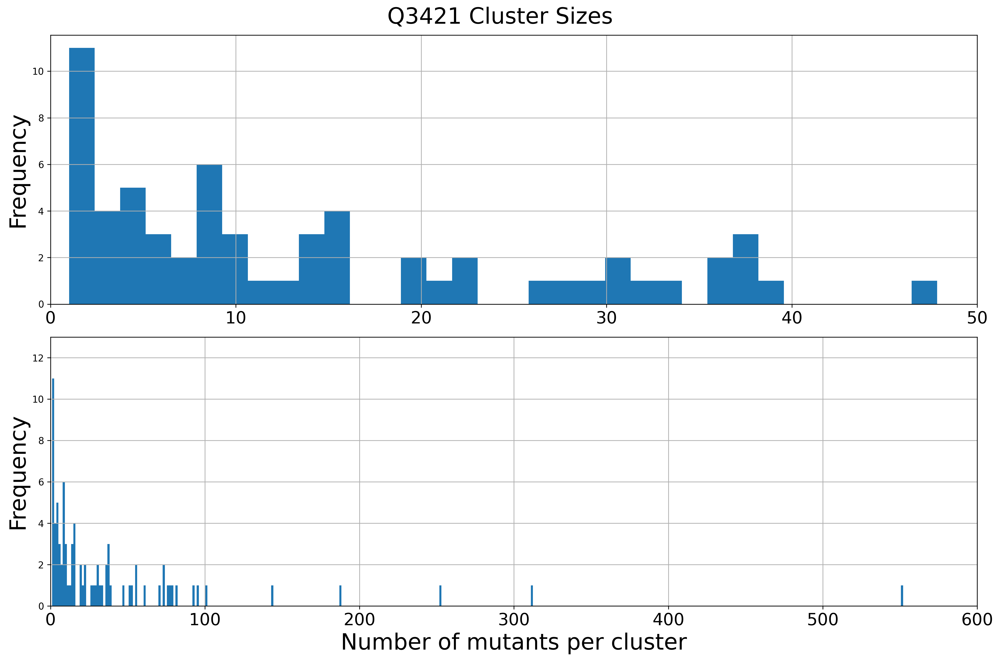

In [4]:
db_class = db_preds.join(db_ddg).join(db_cluster).reset_index('uid2', drop=True)

original_pred_cols = [c for c in db_class.columns if '_dir' in c and not 'runtime' in c and not 'pll' in c]
original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
#for col in ['esm2_650M_dir', 'esm2_150M_dir', 'esm2_15B_half_dir']:
#    original_pred_cols_reduced.remove(col)

# random (Gaussian noise) control
db_class['random_dir'] = np.random.normal(loc=0, size=len(db_class))
db_class['ProTherm'] = False
db_class['ddG_dir'] = db_class['ddG']
#db_class['ensemble_dir'] = db_class['mpnn_20_00_dir'] + db_class['cartesian_ddg_dir']
#db_class['ensemble2_dir'] = db_class['korpm_dir'] + db_class['cartesian_ddg_dir']
#db_class['ensemble3_dir'] = db_class['esm2_650M_dir']*0.1 + db_class['cartesian_ddg_dir']

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'esmif', 'mutcomputex']
supervised = ['cartesian_ddg', 'korpm', 'stability-oracle']

db_class_rescaled = db_class.copy(deep=True)
db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['structural_dir'] = db_class_rescaled[[c for c in db_class.columns if any([s in c for s in structural])]].mean(axis=1)
db_runtimes['runtime_structural_dir']  = db_runtimes[[c for c in db_runtimes.columns if any([s in c for s in structural])]].sum(axis=1)

db_class['evolutionary_dir'] = db_class_rescaled[[c for c in db_class.columns if any([s in c for s in evolutionary])]].mean(axis=1)
db_runtimes['runtime_evolutionary_dir']  = db_runtimes[[c for c in db_runtimes.columns if any([s in c for s in evolutionary])]].sum(axis=1)

db_class['supervised_dir'] = db_class_rescaled[[c for c in db_class.columns if any([s in c for s in supervised])]].mean(axis=1)
db_runtimes['runtime_supervised_dir']  = db_runtimes[[c for c in db_runtimes.columns if any([s in c for s in supervised])]].sum(axis=1)

db_class['clustered_ensemble_dir'] = db_class[['supervised_dir', 'structural_dir', 'evolutionary_dir']].mean(axis=1)
db_runtimes['runtime_clustered_ensemble_dir'] = db_class[['supervised_dir', 'structural_dir', 'evolutionary_dir']].mean(axis=1)

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_runtimes['runtime_mpnn_rosetta_dir'] = db_runtimes[['runtime_supervised_dir', 'runtime_structural_dir', 'runtime_evolutionary_dir']].mean(axis=1)

db_class['mpnn_oracle_dir'] = db_class['stability-oracle_dir'] + db_class['mpnn_20_00_dir']

db_class['cartesian_oracle_dir'] = db_class['stability-oracle_dir'] + db_class['cartesian_ddg_dir']

db_class['mpnn_mean_dir'] = db_class[['mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir']].mean(axis=1)
db_runtimes['runtime_mpnn_mean_dir'] = db_runtimes[['runtime_mpnn_10_00_dir', 'runtime_mpnn_20_00_dir', 'runtime_mpnn_30_00_dir']].sum(axis=1)

db_class['esmif_mean_dir'] = db_class[['esmif_multimer_dir', 'esmif_monomer_dir']].mean(axis=1)
db_runtimes['runtime_esmif_mean_dir'] = db_runtimes[['runtime_esmif_multimer_dir', 'runtime_esmif_monomer_dir']].sum(axis=1)

db_class['mif_mean_dir'] = db_class[['mif_dir', 'mifst_dir']].mean(axis=1)
db_runtimes['runtime_mif_mean_dir'] = db_runtimes[['runtime_mif_dir', 'runtime_mifst_dir']].sum(axis=1)

db_class['esm2_mean_dir'] = db_class[['esm2_15B_half_dir', 'esm2_dir', 'esm2_650M_dir', 'esm2_150M_dir']].mean(axis=1)
db_runtimes['runtime_esm2_mean_dir'] = db_runtimes[['runtime_esm2_15B_half_dir', 'runtime_esm2_dir', 'runtime_esm2_650M_dir', 'runtime_esm2_150M_dir']].sum(axis=1)

db_runtimes['runtime_mutcomputex_dir'] = -1000000000000
db_runtimes['runtime_stability-oracle_dir'] = -1000000000000

print(f'Detected {len(db_class.loc[db_feats_2["on_interface"]])} interface mutations')

#db_class['ensemble_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
# random (Gaussian noise) control
#db_class = db_class.reset_index('uid2', drop=True)
fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

# First plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50])  # Set x-axis limits for the first plot
#axes[0].set_xlabel('Number of mutants per cluster', fontsize=24)  # Set x-label for the first plot
axes[0].tick_params(axis='x', labelsize=18)  # Set x-tick label size for the first plot
axes[0].set_ylabel('Frequency', fontsize=24)  # Set y-label for the first plot

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
#axes[1].set_xscale('log')  # Set x-axis scale for the second plot
axes[1].set_xlim([0, 600]) 
axes[1].set_ylim([0, 13])  # Set x-axis limits for the first plot
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)
# Set labels and tick sizes for the second plot if needed

plt.suptitle('Q3421 Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

In [5]:
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

20 62
20 62


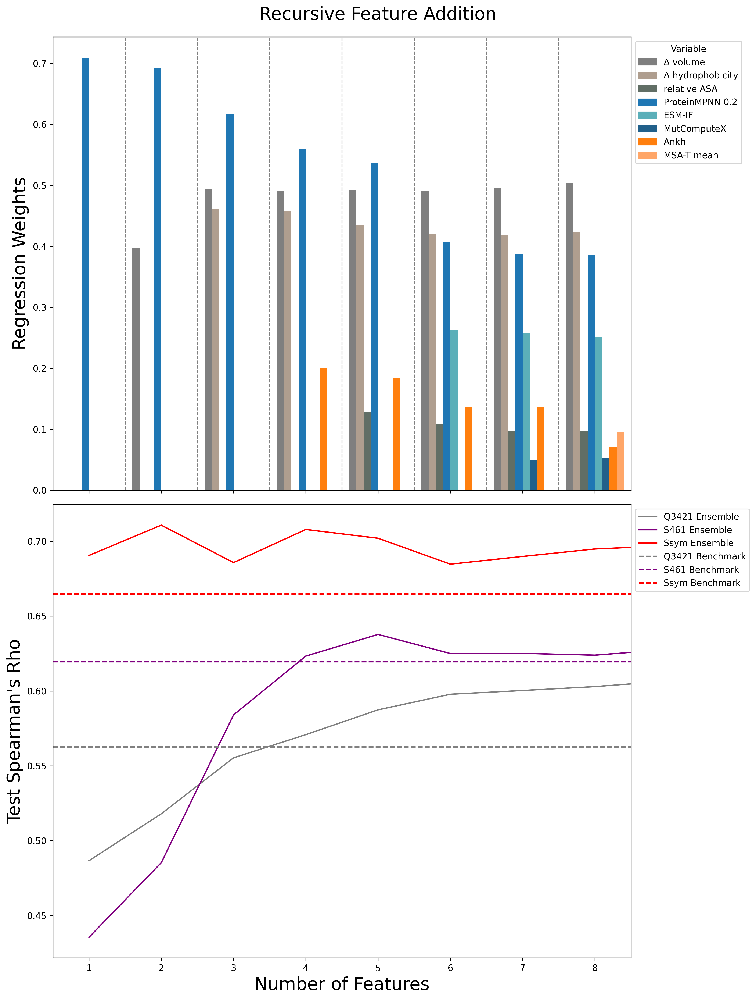

In [6]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
import importlib
importlib.reload(analysis_utils)

cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'mutcomputex_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir']
df_train = db_class.drop('cluster', axis=1).join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_ssym']].loc[~df_train['overlaps_s461']]
df_test = db_class.drop('cluster', axis=1).join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'inference', 's461_mapped_preds_clusters_extra.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'q3421' in c and not 'rfa' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'inference', 'Ssym_mapped_preds_clusters_extra.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'q3421' in c and not 'rfa' in c]]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='q3421_pslm')

df_test_q3421 = dfs_test['q3421']
df_test_q3421 = df_test_q3421.rename(dict(zip([c for c in df_test_q3421.columns if 'rfa' in c], [c+'_dir' for c in df_test_q3421.columns if 'rfa' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'q3421_pslm' in c]]
db_class = db_class.join(df_test_q3421[[c for c in df_test_q3421.columns if 'rfa' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'inference', 's461_mapped_preds_clusters_extra.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'inference', 'Ssym_mapped_preds_clusters_extra.csv'))

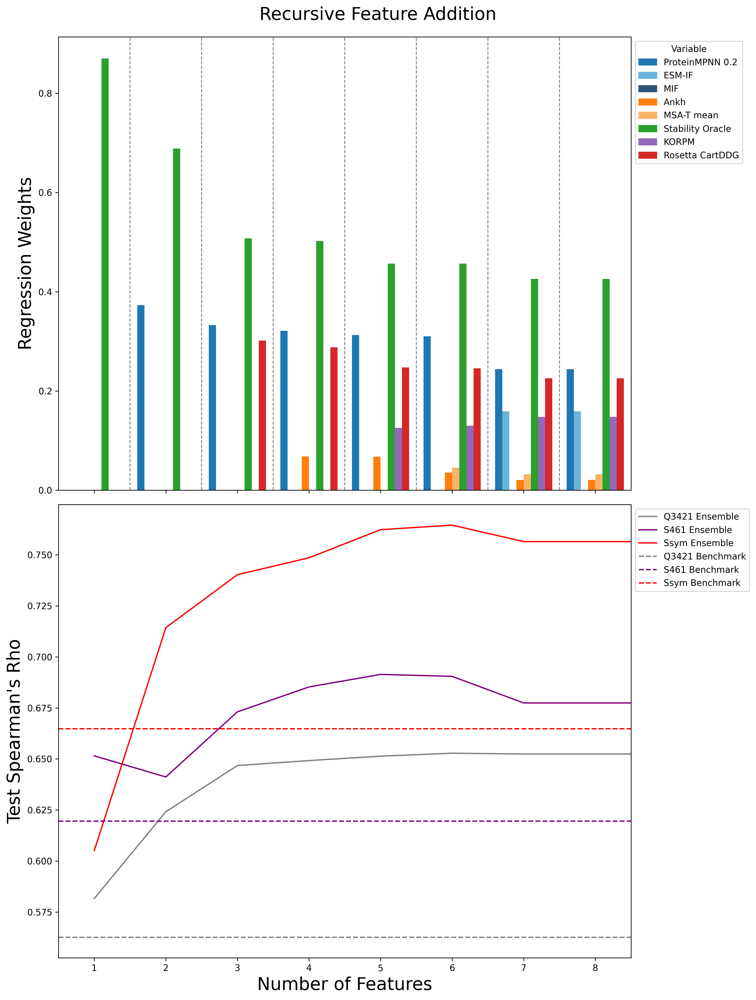

In [7]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
import importlib
importlib.reload(analysis_utils)

cols2 = ['cartesian_ddg_dir', 'korpm_dir', 'stability-oracle_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir']
df_train = db_class.drop('cluster', axis=1).join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_ssym']].loc[~df_train['overlaps_s461']]
df_test = db_class.drop('cluster', axis=1).join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'inference', 's461_mapped_preds_clusters_extra.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'q3421' in c and not 'rfa' in c]]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'inference', 'Ssym_mapped_preds_clusters_extra.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'q3421' in c and not 'rfa' in c]]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]


dfs_test = {'q3421': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='q3421_all')

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa' in c])), axis=1)
#df_test_s461.to_csv(os.path.join(path, 'data', 'inference', 's461_mapped_preds_clusters_extra.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
#df_test_ssym.to_csv(os.path.join(path, 'data', 'inference', 'Ssym_mapped_preds_clusters_extra.csv'))

In [8]:
importlib.reload(analysis_utils)
sp = analysis_utils.compute_stats(db_class, stats=('spearman'), measurements=['ddG'], grouper='cluster', n_classes=2)
sp = sp.reset_index(['measurement', 'model_type', 'class'])['spearman']
db_class['ensemble3_dir'] = 0
for col in original_pred_cols_reduced:
    db_class['ensemble3_dir'] += sp.loc[col] * db_class[col]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

In [9]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
# uncomment this to save all stats and see which are available for other analyses
#summ.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_all.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2_3B', 'ESM-2_15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2_150M', 'ESM-2_650M', 'Ensemble', 'ESM-2_mean', 'ESM-IF_mean', 
    'MIF_mean', 'Clustered_Ensemble', 'Ensemble_2', 'ProteinMPNN_10', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 
    'ESM-1V_2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label', 'ProteinMPNN + Rosetta_CartDDG', 'Stability_Oracle', 'MutComputeX'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
#tmp.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_select.csv')
tmp

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type   model                                              
ΔΔG         unknown      ΔΔG label     3421.0  1.000  1.000  1.000  1.000   
            NaN          Supervised    3421.0  0.382  0.522  0.615  0.693   
                         Structural    3421.0  0.298  0.493  0.545  0.659   
            structural   MIF           3421.0  0.266  0.437  0.480  0.658   
                         ESM-IF        3421.0  0.241  0.430  0.452  0.637   
                         ESM-IF(M)     3421.0  0.226  0.414  0.426  0.630   
            potential    KORPM         3421.0  0.257  0.400  0.471  0.634   
            structural   MIF-ST        3421.0  0.216  0.381  0.402  0.599   
            NaN          Evolutionary  3421.0  0.211  0.371  0.303  0.592   
            evolutionary Ankh          3421.0  0.172  0.344  0.317  0.591   
            structural   MutComputeX   3409.0  0.214  0.402  0.365  0.619   
            evolutionary Tranception   3421.0  0.147  0.331  0.266  0.562   

                                       wAUPRC     wρ  mean_t1s  \
measurement model_type   model                                   
ΔΔG         unknown      ΔΔG label      0.932  1.000     1.939   
            NaN          Supervised     0.563  0.480     0.459   
                         Structural     0.547  0.447     0.261   
            structural   MIF            0.516  0.400     0.468   
                         ESM-IF         0.501  0.386     0.448   
                         ESM-IF(M)      0.491  0.360     0.348   
            potential    KORPM          0.508  0.349     0.092   
            structural   MIF-ST         0.468  0.312    -0.021   
            NaN          Evolutionary   0.463  0.266    -0.125   
            evolutionary Ankh           0.467  0.261    -0.178   
            structural   MutComputeX    0.470  0.253    -0.029   
            evolutionary Tranception    0.423  0.236    -0.158   

                                       Net Stabilization  pred_positives  \
measurement model_type   model                                             
ΔΔG         unknown      ΔΔG label                789.01           761.0   
            NaN          Supervised               101.42           619.0   
                         Structural                89.77           291.0   
            structural   MIF                      -30.68           555.0   
                         ESM-IF                    24.90           396.0   
                         ESM-IF(M)                -29.31           408.0   
            potential    KORPM                   -247.60           874.0   
            structural   MIF-ST                   -15.87           335.0   
            NaN          Evolutionary              34.77           205.0   
            evolutionary Ankh                     -14.90           261.0   
            structural   MutComputeX              -27.85           292.0   
            evolutionary Tranception               24.70           122.0   

                                       mean_stabilization  True Positives  \
measurement model_type   model                                              
ΔΔG         unknown      ΔΔG label                  1.037           761.0   
            NaN          Supervised                 0.164           347.0   
                         Structural                 0.308           183.0   
            structural   MIF                       -0.055           263.0   
                         ESM-IF                     0.063           198.0   
                         ESM-IF(M)                 -0.072           195.0   
            potential    KORPM                     -0.283           354.0   
            structural   MIF-ST                    -0.047           166.0   
            NaN          Evolutionary               0.170           117.0   
            evolutionary Ankh                      -0.057           123.0   
            structural   MutComputeX               

In [10]:
db_class

,esmif_monomer_dir,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_dir,esm2_15B_half_dir,msa_1_dir,...,q3421_pslm_rfa_4_dir,q3421_pslm_rfa_5_dir,q3421_pslm_rfa_6_dir,q3421_pslm_rfa_7_dir,q3421_pslm_rfa_8_dir,q3421_pslm_rfa_9_dir,q3421_pslm_rfa_10_dir,q3421_pslm_rfa_11_dir,q3421_pslm_rfa_12_dir,ensemble3_dir
uid,,,,,,,,,,,,,,,,,,,,,
1A23_30S,-0.043713,1.864485,-6.805952,2.161112,2.015380,-1.341709,-0.043713,-11.571676,-11.668701,-8.661992,...,-0.471024,-0.523979,-0.692873,-0.665914,-0.665372,-0.630529,-0.630529,-0.630529,-0.672307,-25.701164
1A23_32L,-0.042389,1.119251,-7.800102,0.124216,1.953414,-0.178574,-0.042389,-13.755667,-13.076172,-8.351897,...,1.135184,1.071379,0.806034,0.869545,0.834553,0.828676,0.828676,0.828676,0.813489,-22.404572
1A23_32S,-0.029983,-0.854073,-5.414868,0.415694,0.718097,0.932330,-0.029983,-8.291791,-10.436035,-6.135631,...,-0.114860,-0.150395,-0.303614,-0.280819,-0.321443,-0.333034,-0.333034,-0.333034,-0.338813,-16.282155
1A23_32Y,-0.020219,1.528646,-3.414633,-0.015509,0.628828,0.250166,-0.020220,-8.121881,-9.415039,-4.844220,...,0.739446,0.720338,0.647075,0.688089,0.706846,0.723433,0.723433,0.723433,0.714172,-12.044474
1A23_33S,-0.024960,0.348253,-5.093968,1.232823,-0.549477,0.841176,-0.024960,-12.002896,-12.722168,-7.209576,...,-1.015211,-1.106211,-1.042617,-1.030717,-1.027136,-0.991418,-0.991418,-0.991418,-1.016128,-23.013981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,-0.037373,-0.438132,-0.126320,0.094636,0.362146,0.098527,-0.038054,-3.150103,-2.374512,-0.849762,...,0.270955,0.448310,0.228079,0.234399,0.224118,0.220899,0.220899,0.220899,0.178320,-2.796565
5CRO_26Q,-0.004605,0.140129,0.700469,1.785023,1.177964,1.794943,-0.006247,-2.508844,-2.625244,0.924675,...,-0.271795,-0.071077,-0.198536,-0.194921,-0.280659,-0.291212,-0.291212,-0.291212,-0.302688,3.903672
5CRO_26V,0.037691,0.501243,1.538724,1.421123,0.969365,0.458124,0.032355,-3.204980,-2.228027,-1.276998,...,0.315762,0.478798,0.578005,0.574289,0.514597,0.485846,0.485846,0.485846,0.471280,-0.494632


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

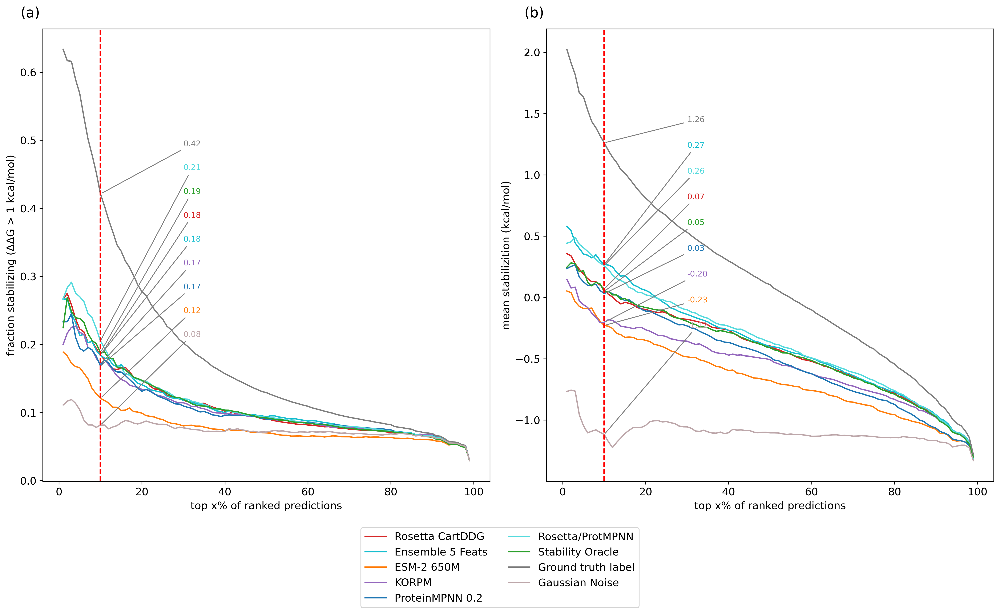

In [11]:
#importlib.reload(analysis_utils)
class_result_new = analysis_utils.compute_stats(db_class, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
analysis_utils.recovery_curves(class_result_new, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'q3421_pslm_rfa_5_dir', 'stability-oracle_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc']) #'mif_dir', 'esmif_multimer_full_dir',

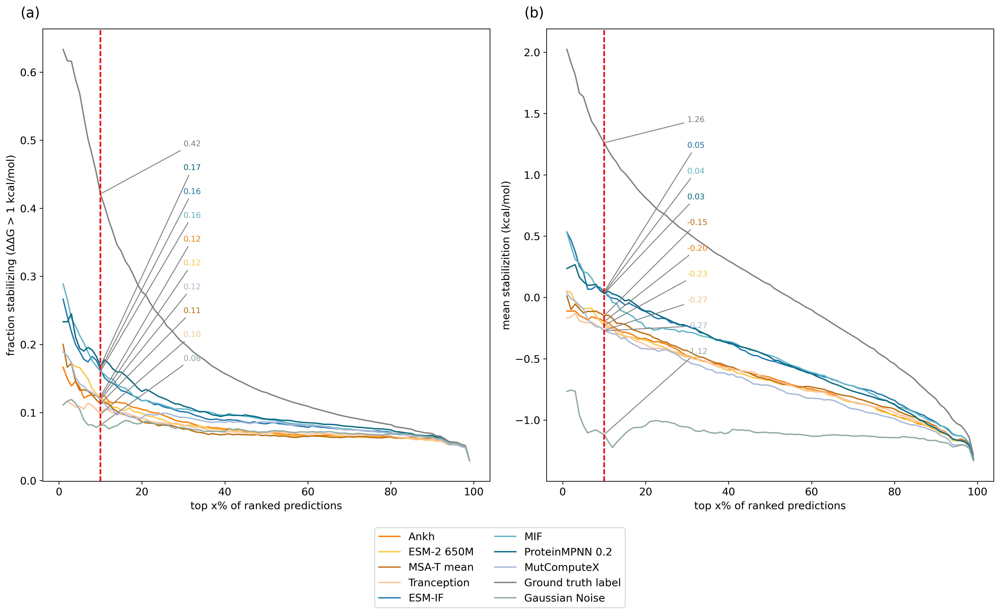

In [12]:
analysis_utils.recovery_curves(class_result_new, ['mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_dir', 'mutcomputex_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc']) #'mif_dir', 'esmif_multimer_full_dir',

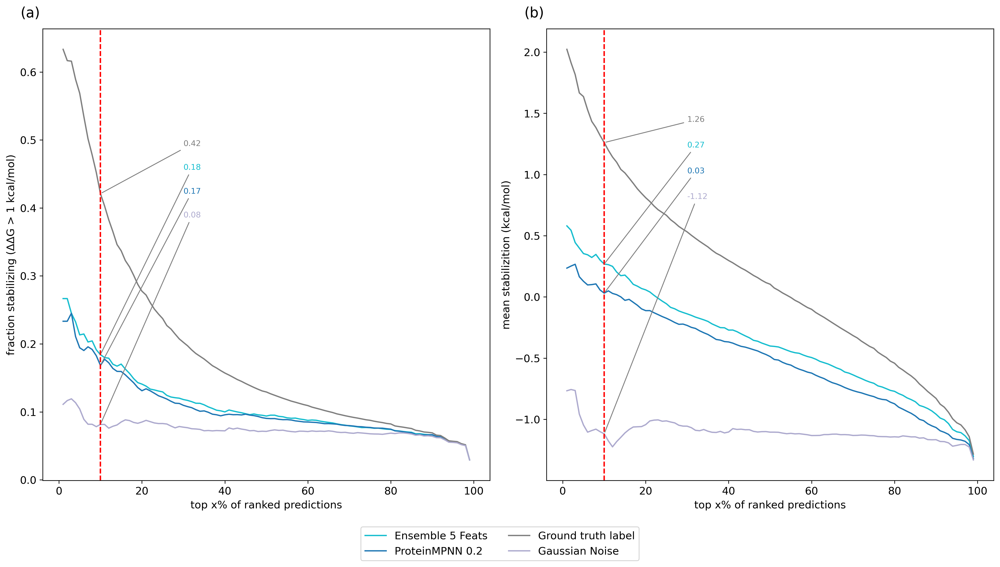

In [13]:
analysis_utils.recovery_curves(class_result_new, ['mpnn_20_00_dir', 'q3421_pslm_rfa_5_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc']) #'mif_dir', 'esmif_multimer_full_dir',

In [14]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp1 = summ.reset_index()

In [15]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = summ.sort_values('net_stabilization_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'q3421_pslm_rfa_2_dir', 
            'q3421_pslm_rfa_3_dir', 
            'q3421_pslm_rfa_4_dir',
            'q3421_pslm_rfa_5_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

s4 = s3[['model_type', 'model', 
    'recall@k1.0_mean', 'recall@k1.0_std',
    'ndcg_mean', 'ndcg_std',
    'weighted_ndcg_mean', 'weighted_ndcg_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'auprc_mean', 'auprc_std', 
    'MCC_mean', 'MCC_std', 
    'mean_stabilization_mean', 'mean_stabilization_std', 
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s6

,Model Type,Model,Recall @ k,NDCG,wNDCG,Spearman's ρ,wρ,AUPRC,MCC,Mean Stabilization,Net Stabilization
0,unknown,ΔΔG label,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.101 ± 0.23,1496.584 ± 604.35
1,structural,Rosetta/ProtMPNN,0.291 ± 0.04,0.628 ± 0.05,0.689 ± 0.03,0.608 ± 0.09,0.467 ± 0.02,0.518 ± 0.05,0.339 ± 0.03,0.192 ± 0.29,211.724 ± 211.97
2,ensemble,Ensemble 3 Feats,0.271 ± 0.04,0.628 ± 0.05,0.708 ± 0.02,0.55 ± 0.06,0.449 ± 0.02,0.48 ± 0.04,0.345 ± 0.03,0.089 ± 0.26,136.992 ± 254.08
3,ensemble,Ensemble 2 Feats,0.256 ± 0.04,0.618 ± 0.05,0.705 ± 0.03,0.504 ± 0.07,0.418 ± 0.01,0.479 ± 0.04,0.323 ± 0.03,0.074 ± 0.35,124.374 ± 227.77
4,ensemble,Ensemble 4 Feats,0.26 ± 0.06,0.621 ± 0.05,0.71 ± 0.03,0.566 ± 0.06,0.456 ± 0.03,0.49 ± 0.05,0.35 ± 0.02,0.047 ± 0.28,119.974 ± 237.24
5,structural,ProteinMPNN 0.1,0.232 ± 0.03,0.612 ± 0.04,0.675 ± 0.02,0.47 ± 0.08,0.386 ± 0.02,0.45 ± 0.04,0.297 ± 0.02,0.041 ± 0.26,83.274 ± 162.79
6,evolutionary,Tranception,0.173 ± 0.01,0.561 ± 0.03,0.589 ± 0.03,0.287 ± 0.04,0.225 ± 0.03,0.333 ± 0.03,0.162 ± 0.02,0.231 ± 0.19,51.046 ± 44.28
7,structural,ESM-IF,0.193 ± 0.03,0.616 ± 0.05,0.651 ± 0.04,0.454 ± 0.07,0.365 ± 0.01,0.416 ± 0.06,0.245 ± 0.05,-0.043 ± 0.51,39.726 ± 287.23
8,structural,ProteinMPNN 0.2,0.223 ± 0.03,0.612 ± 0.04,0.676 ± 0.02,0.483 ± 0.08,0.39 ± 0.03,0.457 ± 0.04,0.286 ± 0.01,-0.011 ± 0.24,35.482 ± 152.52
9,ensemble,Ensemble 5 Feats,0.225 ± 0.05,0.611 ± 0.05,0.703 ± 0.03,0.583 ± 0.06,0.458 ± 0.03,0.484 ± 0.05,0.326 ± 0.02,-0.026 ± 0.26,30.918 ± 260.37


      cluster  variable      value
612        72  ESM-2 3B -14.066276
613        72  ESM-2 3B -14.951569
614        72  ESM-2 3B -10.148347
615        72  ESM-2 3B -14.324051
616        72  ESM-2 3B -12.993503
...       ...       ...        ...
6837       76       ΔΔG   1.100000
6838       76       ΔΔG   1.400000
6839       76       ΔΔG   0.900000
6840       76       ΔΔG  -0.100000
6841       76       ΔΔG   0.400000

[618 rows x 3 columns]


<Axes: xlabel='cluster', ylabel='value'>

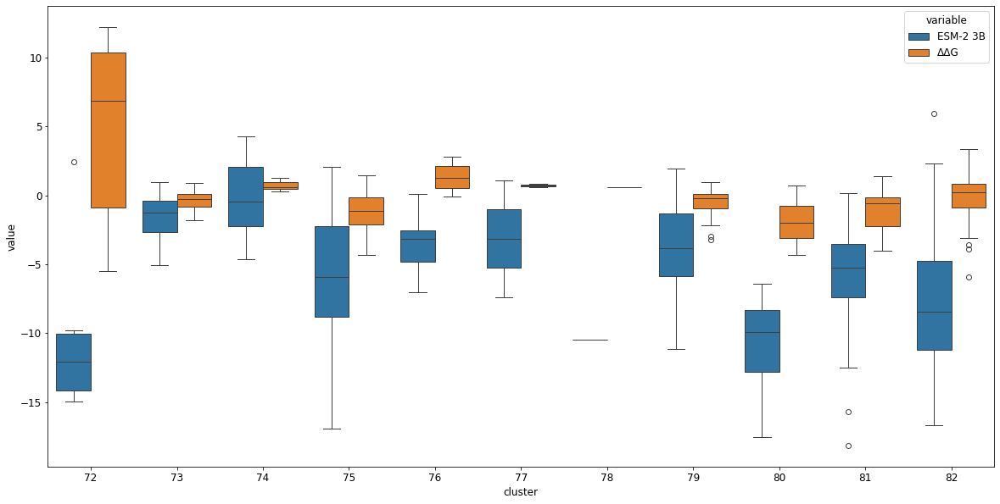

In [16]:
db_plot = db_class.copy(deep=True)
db_plot = db_plot.loc[~db_plot['ddG_dir'].isna()]
db_plot = db_plot.rename({'ddG_dir': 'ΔΔG', 'esm2_dir': 'ESM-2 3B'}, axis=1)
db_plot = db_plot[['cluster', 'ESM-2 3B', 'ΔΔG']].melt(id_vars='cluster')
db_plot = db_plot.loc[db_plot['cluster']>71]
print(db_plot)
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(db_plot, x='cluster', y='value', hue='variable', ax=ax)

In [17]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp2 = summ2.reset_index()

In [18]:
summ2.columns

Index(['runtime_mean', 'runtime_std', 'n_mean', 'n_std', 'tp_mean', 'tp_std',
       'fp_mean', 'fp_std', 'tn_mean', 'tn_std', 'fn_mean', 'fn_std',
       'precision_mean', 'precision_std', 'accuracy_mean', 'accuracy_std',
       'MCC_mean', 'MCC_std', 'auprc_mean', 'auprc_std',
       'mean_stabilization_mean', 'mean_stabilization_std',
       'net_stabilization_mean', 'net_stabilization_std',
       'mean_squared_error_mean', 'mean_squared_error_std', 'spearman_mean',
       'spearman_std', 'mean_spearman_mean', 'mean_spearman_std',
       'weighted_spearman_mean', 'weighted_spearman_std',
       'n_proteins_spearman_mean', 'n_proteins_spearman_std',
       'n_muts_spearman_mean', 'n_muts_spearman_std', 'mean_auprc_mean',
       'mean_auprc_std', 'weighted_auprc_mean', 'weighted_auprc_std',
       'n_proteins_auprc_mean', 'n_proteins_auprc_std', 'n_muts_auprc_mean',
       'n_muts_auprc_std', 'auppc_mean', 'auppc_std', 'aumsc_mean',
       'aumsc_std'],
      dtype='object')

In [19]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k',
    'mean_squared_error': 'MSE'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = summ2.sort_values('mean_squared_error_mean', ascending=True).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir'])].drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 
    'mean_squared_error_mean', 'mean_squared_error_std',
    'accuracy_mean', 'accuracy_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s6

,Model Type,Model,MSE,Accuracy,Spearman's ρ,wρ,Net Stabilization
0,unknown,ΔΔG label,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1581.916 ± 486.83
1,transfer,Stability Oracle,3.848 ± 0.83,0.769 ± 0.02,0.518 ± 0.05,0.41 ± 0.05,-46.936 ± 194.3
2,potential,KORPM,4.345 ± 0.9,0.729 ± 0.02,0.445 ± 0.07,0.282 ± 0.03,-222.502 ± 229.55
3,structural,MutComputeX,4.632 ± 0.77,0.757 ± 0.03,0.324 ± 0.07,0.228 ± 0.01,-154.146 ± 65.67
4,structural,ESM-IF,5.572 ± 0.72,0.763 ± 0.03,0.42 ± 0.11,0.379 ± 0.04,82.97 ± 108.57
5,structural,ESM-IF(M),5.582 ± 0.73,0.755 ± 0.03,0.385 ± 0.12,0.34 ± 0.05,-51.022 ± 141.32
6,evolutionary,Tranception,5.624 ± 0.72,0.761 ± 0.04,0.238 ± 0.11,0.212 ± 0.04,54.56 ± 32.97
7,unknown,Gaussian Noise,6.612 ± 0.75,0.513 ± 0.01,0.015 ± 0.03,0.008 ± 0.01,-2465.612 ± 1180.34
8,structural,ProteinMPNN 0.3,8.33 ± 1.07,0.766 ± 0.03,0.459 ± 0.07,0.4 ± 0.02,102.66 ± 131.43
9,structural,ProteinMPNN 0.2,8.596 ± 1.0,0.765 ± 0.03,0.47 ± 0.05,0.411 ± 0.03,89.786 ± 140.1


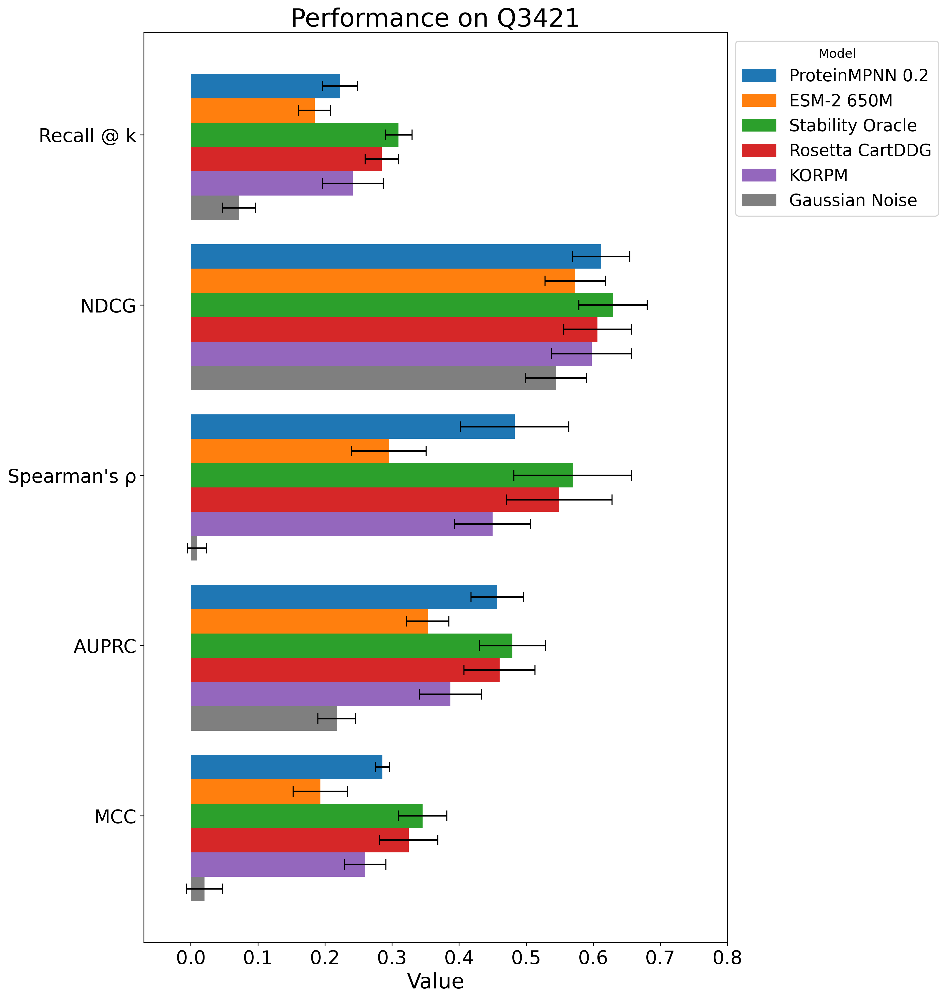

In [20]:
import importlib
importlib.reload(analysis_utils)

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

tmp3 = tmp1.copy(deep=True)#.set_index('model')
#tmp3['fractional_gain_mean'] = tmp3['net_stabilization_mean'] / tmp3.at['ddG_dir', 'net_stabilization_mean']
#tmp3['fractional_gain_std'] = tmp3['net_stabilization_std'] / tmp3.at['ddG_dir', 'net_stabilization_mean']
#tmp3 = tmp3.reset_index()
#tmp3['fractional_gain_mean']

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp3.sort_values('spearman_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s4 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir', 'mpnn_rosetta_dir'])]
#s4 = s3[['model', 'n_mean', 'MCC_mean', 'MCC_std', 'auprc_mean', 'auprc_std', 'spearman_mean', 'spearman_std', 'weighted_ndcg_mean', 'weighted_ndcg_std', 'recall@k1.0_mean', 'recall@k1.0_std', 'mean_stabilization_mean', 'mean_stabilization_std']]
#s4['model'] = s4['model'].map(lambda x: remap_names_2.get(x, x[:-4]))
s5 = s4

tmp2 = s5[[ 'model',  
            'MCC_mean', 'MCC_std',
            'auprc_mean', 'auprc_std',
            #'weighted_spearman_mean', 'weighted_spearman_std',
            'spearman_mean', 'spearman_std',
            #'weighted_ndcg_mean', 'weighted_ndcg_std',
            'ndcg_mean', 'ndcg_std',
            'recall@k1.0_mean', 'recall@k1.0_std', 
            ]].set_index('model')

tmp2.columns = [new_remap_cols[c] for c in tmp2.columns]
tmp2 = tmp2.reset_index().drop_duplicates()

#analysis_utils.make_bar_chart(tmp2, models=['ProteinMPNN 0.2', 'ESM-2 650M', 'Stability Oracle', 'Rosetta CartDDG', 'KORPM', 'DDGun3D', 'MAESTRO', 'Gaussian Noise'], title='Q3421', xlim=(-0.5, 0.8), figsize=(24, 16))
analysis_utils.make_bar_chart(tmp2, models=['mpnn_20_00', 'esm2_650M', 'stability-oracle', 'cartesian_ddg', 'korpm', 'DDGun3D', 'MAESTRO', 'random'], title='Q3421', xlim=(-0.07, 0.8), figsize=(10, 16))

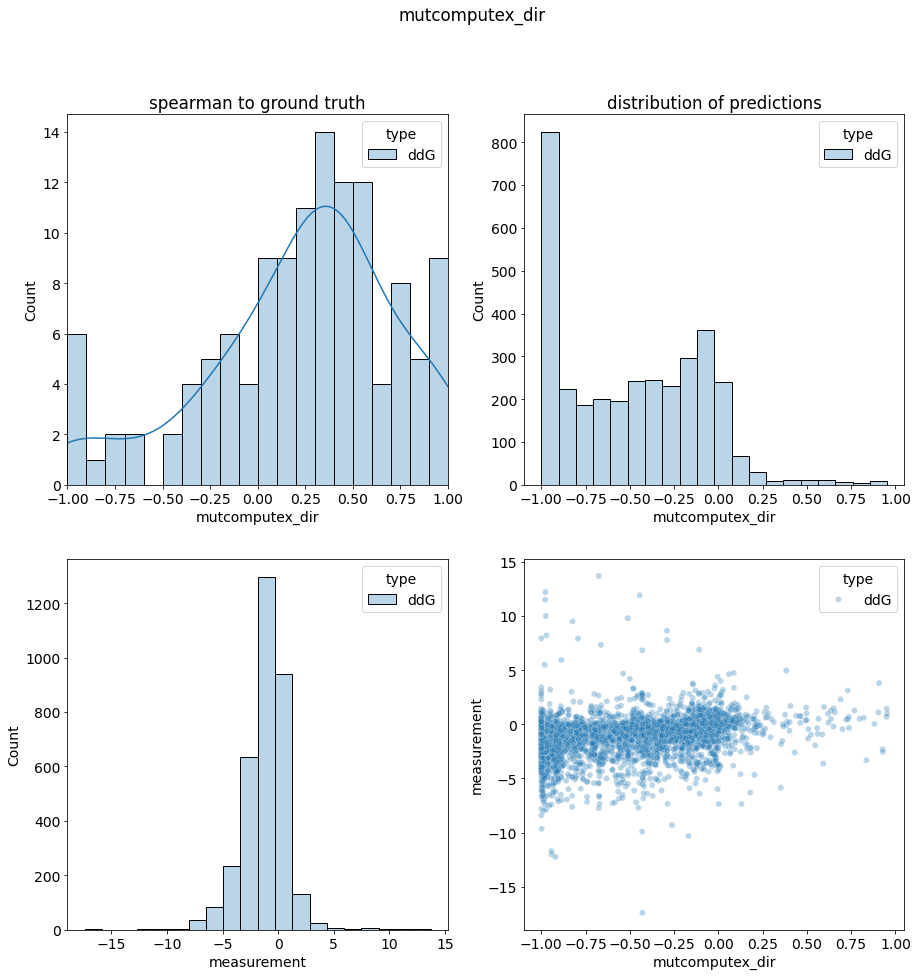

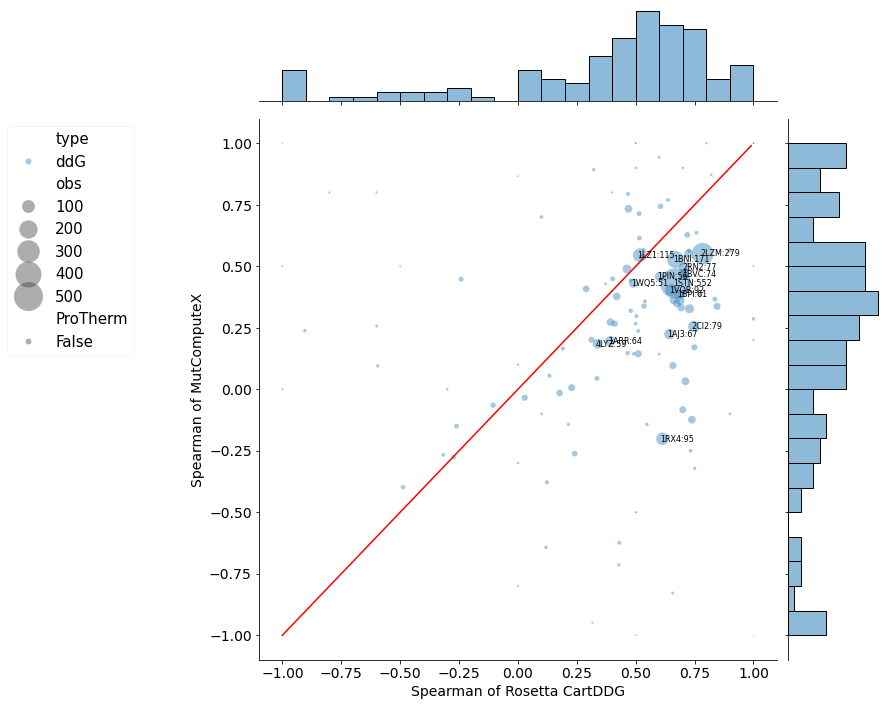

mutcomputex_dir cartesian_ddg_dir
ddG n_total                        3409              3409
    ungrouped_spearman         0.365178          0.570227
    n_proteins                      147               147
    n_proteins_spearman             125               125
    avg_spearman                0.23527          0.365982
    weighted_spearman          0.259367          0.436816
    runtime (s)                     NaN               NaN

In [21]:
db_class_2 = db_class.copy(deep=True)
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2['code'] = db_class_2.index.str[:4]
# SUPPLEMENTARY FIGURE 1 (second figure generated)
analysis_utils.correlations(db_class_2, None, stat='spearman', 
    score_name='mutcomputex_dir', score_name_2='cartesian_ddg_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_pslm_rfa_5_dir', 'stability-oracle_dir', 'cartesian_ddg_dir', 'mif_dir', 'mpnn_20_00_dir', 'esmif_multimer_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'mutcomputex_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'esm2_15B_half_dir', 'random_dir']
class
0 >= ΔΔG > -1.5    873
ΔΔG <= -1.5        751
ΔΔG > 0            465
Name: n, dtype: int64


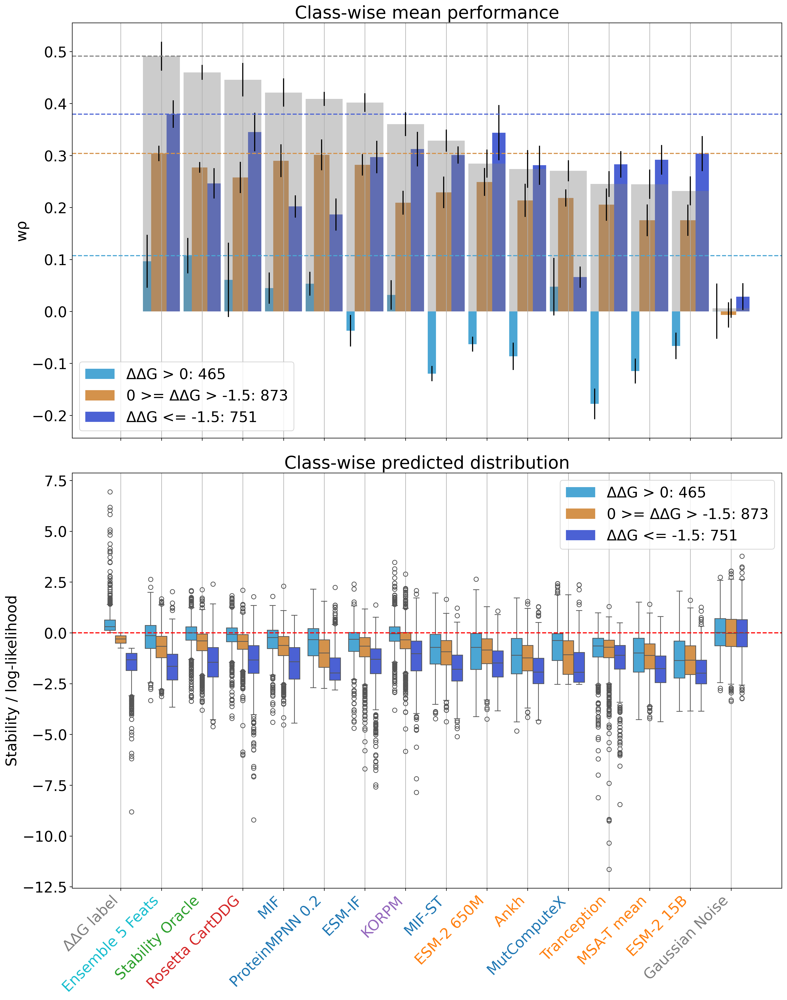

In [22]:
# Todo: bootstrap by adding / removing proteins?
# Figure 1 a + b
importlib.reload(analysis_utils)

subset = ['q3421_pslm_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            'mutcomputex_dir',
            'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

db_complete = db_class.join(db_feats_2, how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster'
                        )

  0%|          | 0/5 [00:00<?, ?it/s]

conservation > 80% : 320
conservation <= 80% : 1468
['ddG_dir', 'q3421_pslm_rfa_5_dir', 'stability-oracle_dir', 'cartesian_ddg_dir', 'mif_dir', 'mpnn_20_00_dir', 'esmif_multimer_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'mutcomputex_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_15B_half_dir', 'tranception_dir', 'random_dir']
class
conservation <= 80    1468
conservation > 80      320
Name: n, dtype: int64


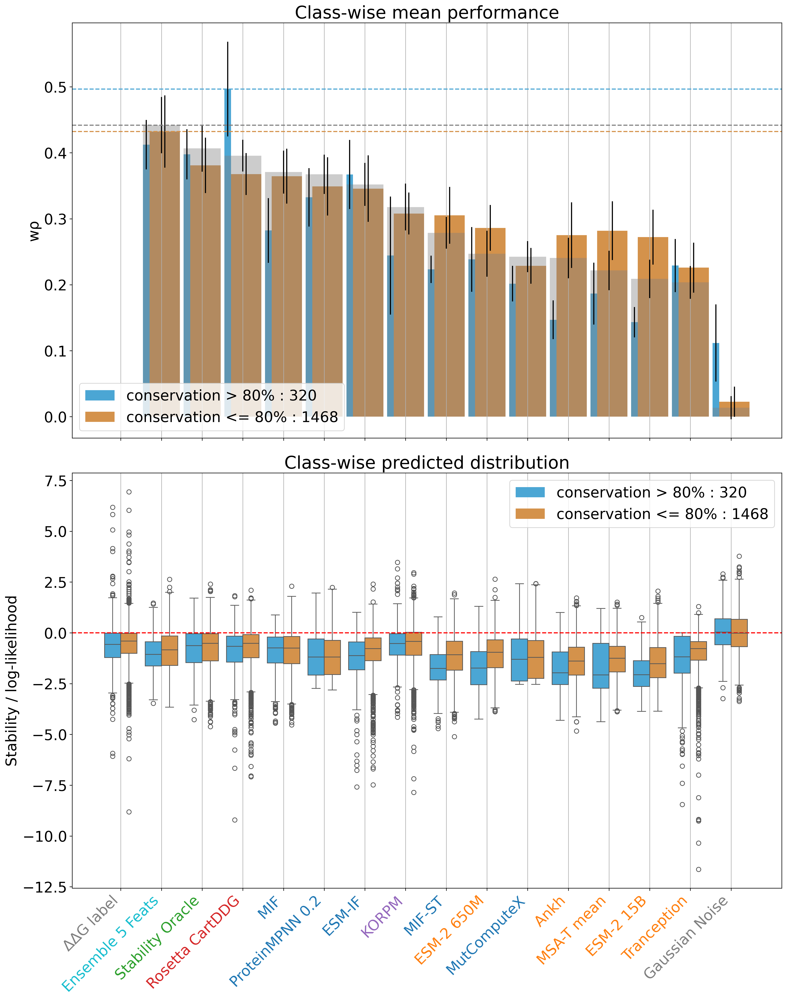

In [23]:
# Supplementary Figure 3
importlib.reload(analysis_utils)
current_feats = ['conservation', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)#dropna(how='any')
#print('dropped', l1-len(db_fig), 'mutants')
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'conservation', 
                        split_col_2 = None, 
                        threshold_1 = 80, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_pslm_rfa_5_dir', 'stability-oracle_dir', 'cartesian_ddg_dir', 'mif_dir', 'mpnn_30_00_dir', 'mpnn_10_00_dir', 'esmif_multimer_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'mutcomputex_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_15B_half_dir', 'random_dir']
class
1 >= delta_vol > -1     576
delta_vol <= -1        1189
delta_vol > 1           362
Name: n, dtype: int64


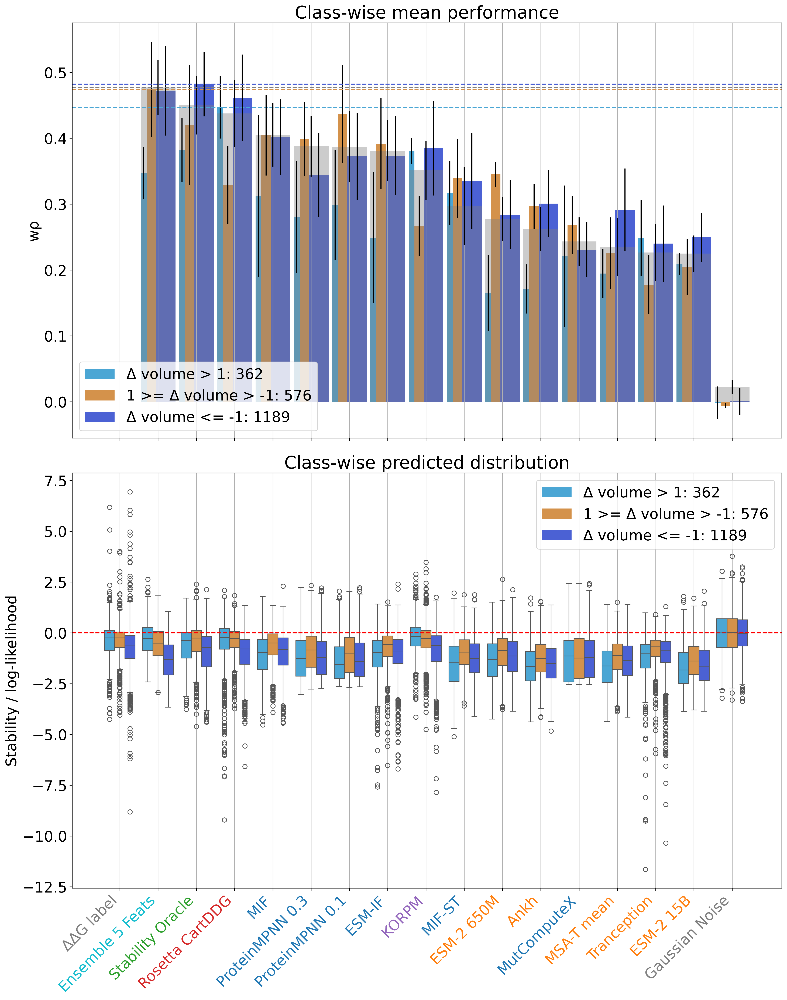

In [24]:
subset = ['q3421_pslm_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_10_00_dir',
            #'mpnn_20_00_dir',
            'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            'mutcomputex_dir',
            'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

# Figure 1 c + d

current_feats = ['delta_vol', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)#dropna(how='any')
#print('dropped', l1-len(db_fig), 'mutants')
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = -1, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )

dropped 0 mutants


  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'stability-oracle_dir', 'mpnn_10_00_dir', 'mif_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'korpm_dir', 'mifst_dir', 'ankh_dir', 'esm2_650M_dir', 'mutcomputex_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_15B_half_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.2    638
delta_kdh <= 0 & rel_ASA > 0.2     447
delta_kdh > 0 & rel_ASA <= 0.2     470
delta_kdh > 0 & rel_ASA > 0.2      773
Name: n, dtype: int64


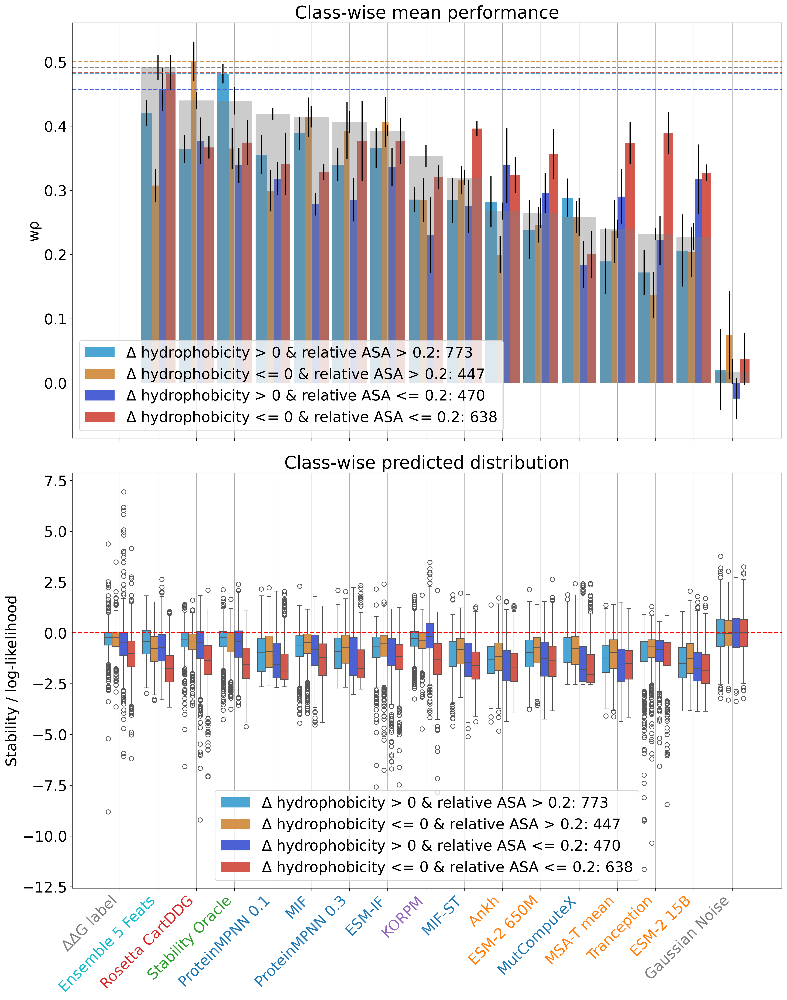

In [25]:
# Supplementary Figure 2
importlib.reload(analysis_utils)
current_feats = ['delta_kdh', 'rel_ASA', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)#dropna(how='any')
db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
print('dropped', l1-len(db_fig), 'mutants')
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

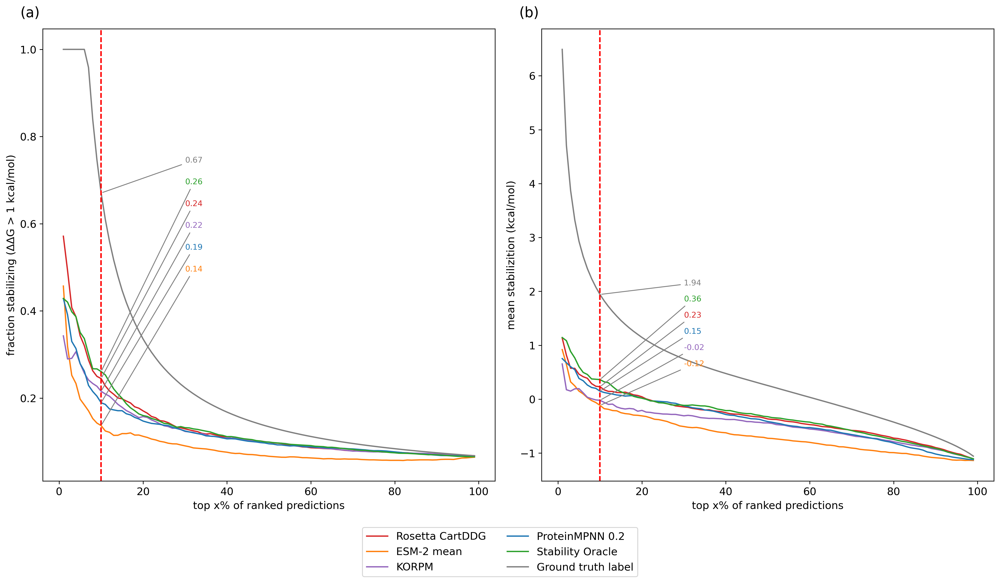

In [26]:
importlib.reload(analysis_utils)
class_result_new = analysis_utils.compute_stats(db_class, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper=None, n_bootstraps=0)
analysis_utils.recovery_curves(class_result_new, ['q3421_rfa_5_dir', 'mpnn_20_00_dir', 'cartesian_ddg_dir', 'korpm_dir', 'stability-oracle_dir', 'esm2_mean_dir', 'ddG_dir', 'ensemble_dir'], spacing=0.1, measurements=['ddG'])

In [27]:
db_runtimes

,,runtime_esmif_monomer_dir,runtime_mif_dir,runtime_mifst_dir,runtime_mpnn_10_00_dir,runtime_mpnn_20_00_dir,runtime_mpnn_30_00_dir,runtime_esmif_multimer_dir,runtime_esm2_dir,runtime_esm2_15B_half_dir,runtime_msa_1_dir,...,runtime_evolutionary_dir,runtime_supervised_dir,runtime_clustered_ensemble_dir,runtime_mpnn_rosetta_dir,runtime_mpnn_mean_dir,runtime_esmif_mean_dir,runtime_mif_mean_dir,runtime_esm2_mean_dir,runtime_mutcomputex_dir,runtime_stability-oracle_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,0.149636,0.587559,0.691454,0.570900,0.545414,0.590605,0.149776,0.661282,0.806620,3.162978,...,50.474567,5.003,NaN,19.587637,1.706920,0.299411,1.279013,3.035912,-1000000000000,-1000000000000
1A23_32L,1A23_32L,0.148979,0.012633,0.067305,0.008186,0.008035,0.008380,0.149100,0.106528,0.056012,1.776896,...,39.328186,6.003,NaN,15.244601,0.024601,0.298079,0.079938,0.242079,-1000000000000,-1000000000000
1A23_32S,1A23_32S,0.148887,0.010457,0.032906,0.007998,0.007837,0.008249,0.148934,0.106480,0.055848,1.772707,...,39.282209,6.003,NaN,15.216826,0.024085,0.297821,0.043363,0.241065,-1000000000000,-1000000000000
1A23_32Y,1A23_32Y,0.148801,0.010534,0.031908,0.008019,0.007871,0.008245,0.149013,0.106433,0.055890,1.766231,...,39.260884,6.003,NaN,15.209425,0.024135,0.297814,0.042442,0.240635,-1000000000000,-1000000000000
1A23_33S,1A23_33S,0.148847,0.010505,0.031931,0.008003,0.007819,0.008238,0.148916,0.106443,0.055874,1.767327,...,39.245586,6.003,NaN,15.204282,0.024060,0.297762,0.042437,0.238976,-1000000000000,-1000000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,0.062981,0.005034,0.026864,0.007619,0.007620,0.007960,0.104130,0.056128,0.040772,0.614574,...,19.319680,6.003,NaN,8.514963,0.023198,0.167111,0.031898,0.173504,-1000000000000,-1000000000000
5CRO_26Q,5CRO_26Q,0.063134,0.004711,0.026535,0.007602,0.007609,0.007947,0.104140,0.056195,0.040771,0.615240,...,19.331748,6.003,NaN,8.518809,0.023158,0.167274,0.031246,0.173562,-1000000000000,-1000000000000
5CRO_26V,5CRO_26V,0.062989,0.005018,0.026477,0.007678,0.007599,0.007930,0.104168,0.056076,0.040760,0.614400,...,19.319639,6.003,NaN,8.514833,0.023207,0.167157,0.031495,0.173376,-1000000000000,-1000000000000


In [28]:
# generate ensembles for Model Complementarity section

zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]
models += ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']

#db_summ = db_preds.join(db_ddg).join(db_cluster)
db_summ = db_class
db_summ['ddG_dir'] = db_summ['ddG']
db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
#print('saving...')
#dfm.to_csv('~/zs_suppl/preds_ensemble_fireprot_3_models.csv')
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))

concatenating
joining...


In [29]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

In [30]:
importlib.reload(analysis_utils)
# compute all statistics on the combined set (already done, takes ~12 hours)
#d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'ensemble_q3421_2_models_3_weights_x3.csv'), overwrite=True)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                          class             
NaN         ddG_dir                                        NaN    1.000000   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN    0.751689   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN    0.761829   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN    0.749615   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.783180   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     NaN    0.751038   
structural  mpnn_rosetta_dir                               NaN    0.783273   
            cartesian_ddg_dir + mpnn_mean_dir * 0.5        NaN    0.784014   
            esmif_multimer_dir + delta_vol_dir * 0.2       NaN    0.716473   
NaN         stability-oracle_dir + delta_chg_dir * 0.2     NaN    0.755111   
structural  cartesian_ddg_dir + mpnn_mean_dir * 1          NaN    0.778275   
            mpnn_mean_dir + cartesian_ddg_dir * 1          NaN    0.778275   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.767802   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.791328   
NaN         stability-oracle_dir + delta_vol_dir * 0.5     NaN    0.746402   
structural  cartesian_ddg_dir + mif_mean_dir * 0.5         NaN    0.764681   
            cartesian_ddg_dir + mif_dir * 1                NaN    0.766306   
            mif_dir + cartesian_ddg_dir * 1                NaN    0.766306   
            cartesian_ddg_dir + esmif_mean_dir * 0.5       NaN    0.765972   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.776990   

                                                                     auprc  \
model_type  model                                          class             
NaN         ddG_dir                                        NaN    1.000000   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN    0.482721   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN    0.500235   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN    0.474306   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.529519   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     NaN    0.482722   
structural  mpnn_rosetta_dir                               NaN    0.528968   
            cartesian_ddg_dir + mpnn_mean_dir * 0.5        NaN    0.532751   
            esmif_multimer_dir + delta_vol_dir * 0.2       NaN    0.475154   
NaN         stability-oracle_dir + delta_chg_dir * 0.2     NaN    0.492798   
structural  cartesian_ddg_dir + mpnn_mean_dir * 1          NaN    0.532617   
            mpnn_mean_dir + cartesian_ddg_dir * 1          NaN    0.532617   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.503470   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.522532   
NaN         stability-oracle_dir + delta_vol_dir * 0.5     NaN    0.473575   
structural  cartesian_ddg_dir + mif_mean_dir * 0.5         NaN    0.503441   
            cartesian_ddg_dir + mif_dir * 1                NaN    0.506585   
            mif_dir + cartesian_ddg_dir * 1                NaN    0.506585   
            cartesian_ddg_dir + esmif_mean_dir * 0.5       NaN    0.500644   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.526972   

                                                                  0.0_n_stable  \
model_type  model                                          class                 
NaN         ddG_dir                                        NaN           631.0   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN           623.0   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN           626.0   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN           624.0   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN           761.0   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     Na

3421


  0%|          | 0/1000 [00:00<?, ?it/s]

0.08345390248046786
['Stability Oracle', 'Rosetta CartDDG', 'ProteinMPNN 0.2', 'MIF', 'KORPM', 'ESM-IF', 'MIF-ST', 'MutComputeX', 'Ankh', 'MSA-T mean', 'Tranception', 'ESM-2 3B', 'ESM-1V mean']


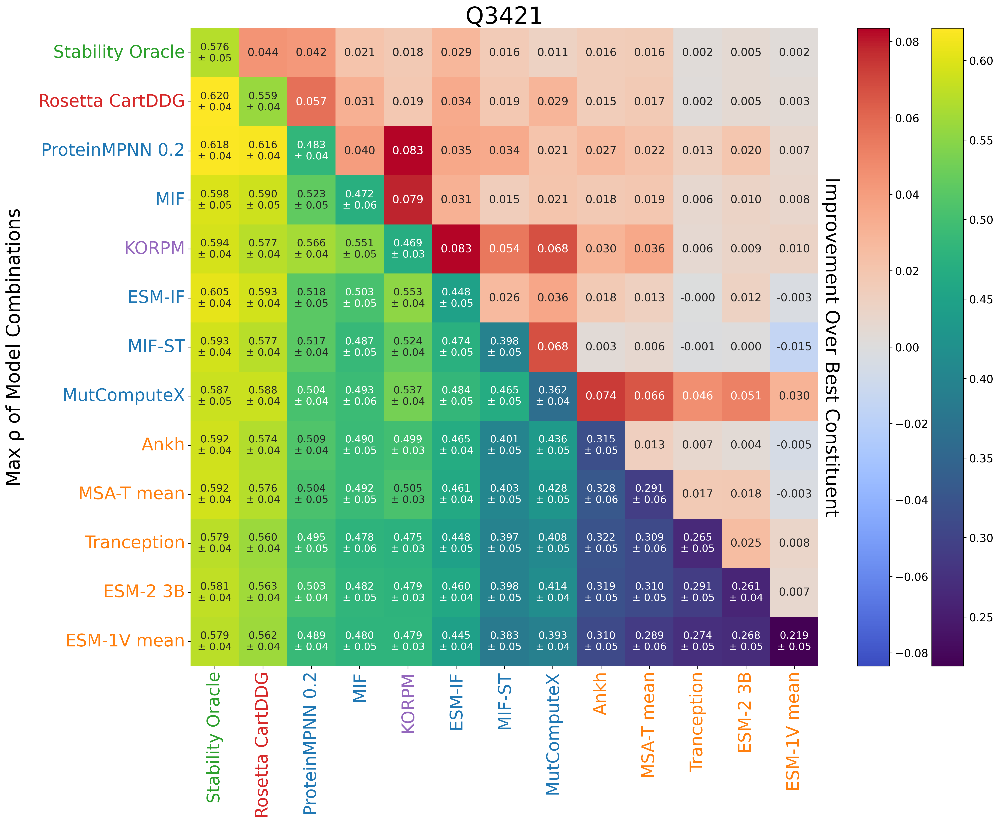

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,1,0.620283,0.0
2,stability-oracle_dir,1,mpnn_20_00_dir,0.5,0.618221,0.0
3,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.61561,0.0
4,stability-oracle_dir,1,cartesian_ddg_dir,0.5,0.614629,0.0
5,cartesian_ddg_dir,1,stability-oracle_dir,0.5,0.613987,0.0
...,...,...,...,...,...,...
386,esm1v_mean_dir,1,tranception_dir,0.5,0.249599,0.0
387,esm1v_mean_dir,1,ankh_dir,0.2,0.2482,0.0
388,esm1v_mean_dir,1,msa_transformer_mean_dir,0.2,0.243298,0.0


In [31]:
# Figure 3
importlib.reload(analysis_utils)
custom_colors = {
                 'cartesian_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_dir': 'green',
                 'ankh_dir': 'blue',
                 'esm2_dir': 'blue',
                 'esmif_multimer_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'esm2_mean_dir': 'blue',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_mean_dir': 'purple',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mif_mean_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'mutcomputex_dir': 'red',
                 'stability-oracle_dir': 'red'
                 #'delta_kdh_dir': 'blue',
                 #'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 #'random_dir': 'black',
                 #'rel_ASA_dir': 'red',
                }

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db_ddg, statistic, measurement, n_bootstraps=1000, upper=upper, subset=list(custom_colors.keys()), title='Q3421')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

In [32]:
stat_df

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,1,0.620283,0.0
2,stability-oracle_dir,1,mpnn_20_00_dir,0.5,0.618221,0.0
3,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.61561,0.0
4,stability-oracle_dir,1,cartesian_ddg_dir,0.5,0.614629,0.0
5,cartesian_ddg_dir,1,stability-oracle_dir,0.5,0.613987,0.0
...,...,...,...,...,...,...
386,esm1v_mean_dir,1,tranception_dir,0.5,0.249599,0.0
387,esm1v_mean_dir,1,ankh_dir,0.2,0.2482,0.0
388,esm1v_mean_dir,1,msa_transformer_mean_dir,0.2,0.243298,0.0


3421


  0%|          | 0/5 [00:00<?, ?it/s]

168.52999999999997
['ProteinMPNN 0.2', 'Tranception', 'ESM-IF', 'Ankh', 'Rosetta CartDDG', 'MSA-T mean', 'MIF-ST', 'ESM-2 3B', 'MutComputeX', 'MIF', 'Stability Oracle', 'ESM-1V mean', 'KORPM']


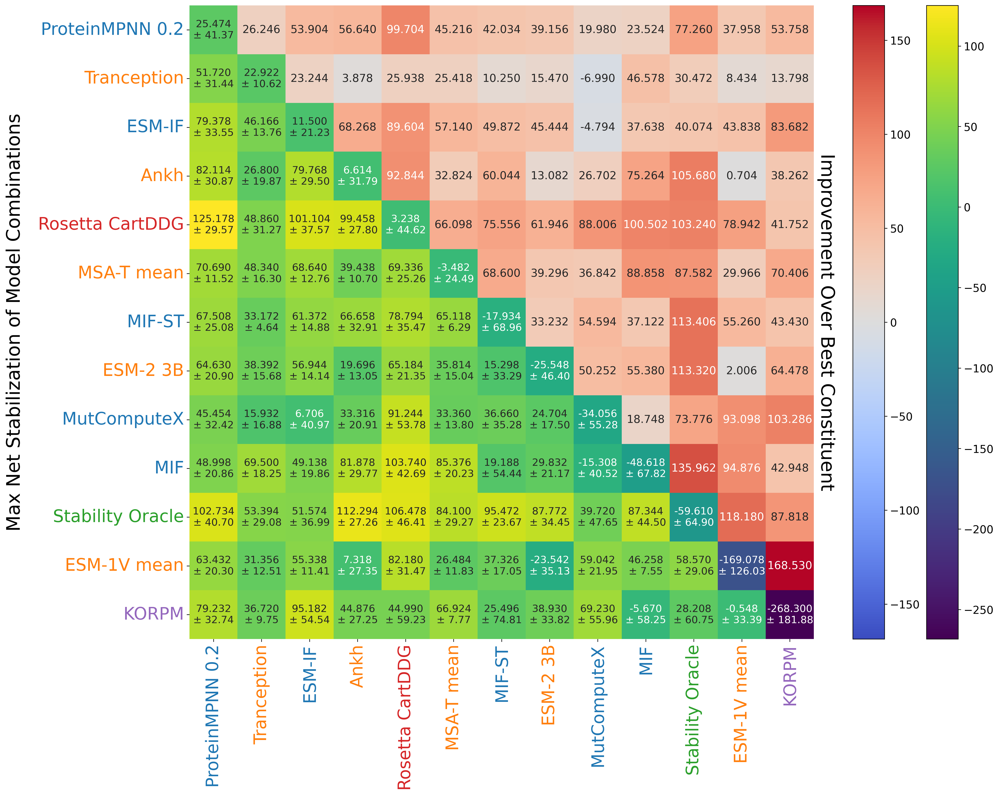

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,125.178,0.000428
2,stability-oracle_dir,1,ankh_dir,0.2,112.294,0.002703
3,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,109.142,0.002867
4,cartesian_ddg_dir,1,mpnn_20_00_dir,1,108.308,0.000159
5,cartesian_ddg_dir,1,stability-oracle_dir,1,106.478,0.005834
...,...,...,...,...,...,...
386,korpm_dir,1,esm2_dir,0.2,-109.878,0.05161
387,korpm_dir,1,tranception_dir,0.2,-114.84,0.092294
388,korpm_dir,1,cartesian_ddg_dir,0.2,-119.01,0.045196


In [34]:
# Figure 3
importlib.reload(analysis_utils)
custom_colors = {
                 'cartesian_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_dir': 'green',
                 'ankh_dir': 'blue',
                 'esm2_dir': 'blue',
                 'esmif_multimer_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'esm2_mean_dir': 'blue',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_mean_dir': 'purple',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mif_mean_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'mutcomputex_dir': 'red',
                 'stability-oracle_dir': 'red'
                 #'delta_kdh_dir': 'blue',
                 #'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 #'random_dir': 'black',
                 #'rel_ASA_dir': 'red',
                }

measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db_ddg, statistic, measurement, n_bootstraps=5, upper=upper, subset=list(custom_colors.keys()))
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

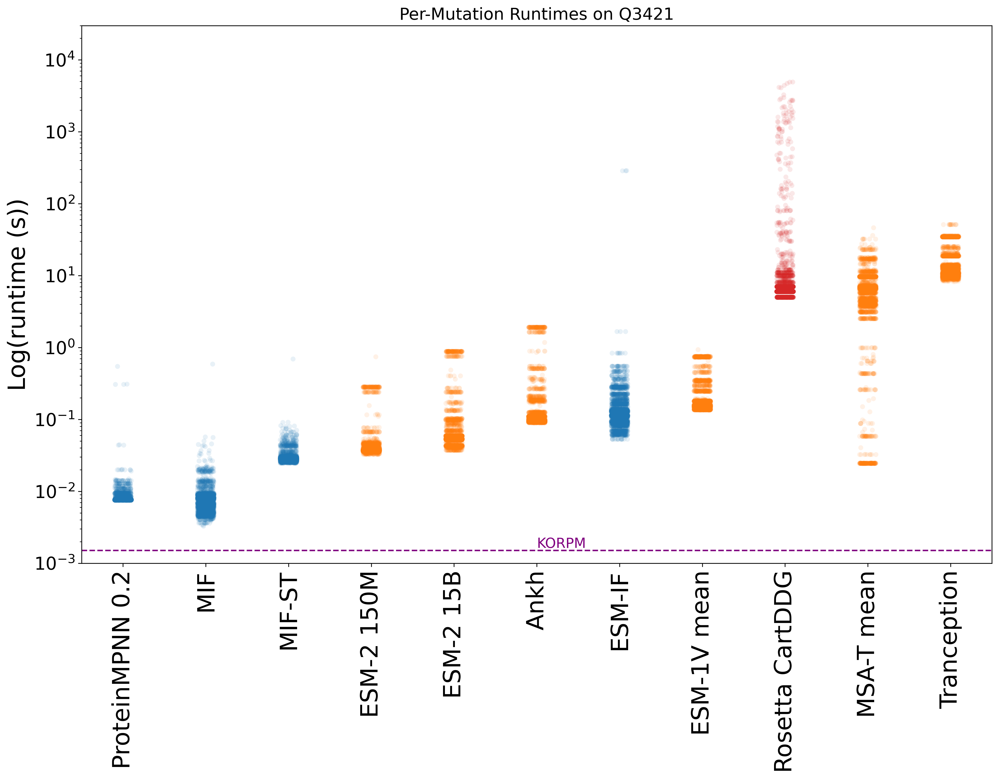

In [35]:
# SUPPLEMENTARY FIGURE 5

int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=0.0015, color='purple', linestyle='--', label='KORPM')
plt.text(5, 0.0015, 'KORPM', color='purple', verticalalignment='bottom')



#ax.legend(handles=[hybrid_patch, evolutionary_patch, structural_patch, sequence_patch], title='Input', loc='upper left')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421')
plt.yscale('log')
plt.ylim(10e-4, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

In [36]:
neff = pd.read_csv(os.path.join(path, 'data', 'features', 'neff_s669.csv'), header=None).set_index(0) # todo / fix
neff.index.name = 'code'
neff.columns = ['neff']

s669_feats = pd.read_csv(os.path.join(path, 'data', 'features', 's669_local_mapped_feats.csv'))
s669_feats['uid'] = s669_feats['code'] + '_' + s669_feats['position_orig'].astype(str) + s669_feats['mutation']
s669_feats['uid2'] = s669_feats['code'] + '_' + s669_feats['position'].astype(str) + s669_feats['mutation']

s669_feats = s669_feats.set_index('uid')
s669_feats = s669_feats[['uid2', 'wild_type', 'on_interface', 'entropy', 'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 'structure_length', 'multimer', 'SS',
                        'features', 'hbonds', 'saltbrs', 'b_factor', 'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', 'is_nmr', 'pH', 'resolution',
                        'SOL_ACC_dir', 'SOL_ACC_inv']] #'residue_depth',

s669_feats['on_interface'] = s669_feats['on_interface'].astype(int)
s669_feats['features'] = s669_feats['features'].fillna("")#.apply(list)
#db_complete = db_complete.reset_index('uid').join(s669_feats.set_index('uid'))
s669_feats['delta_kdh'] = s669_feats['kdh_mut'] - s669_feats['kdh_wt']
s669_feats['delta_vol'] = s669_feats['vol_mut'] - s669_feats['vol_wt']
s669_feats['delta_chg'] = s669_feats['chg_mut'] - s669_feats['chg_wt']
s669_feats['delta_asa'] = s669_feats['SOL_ACC_inv'] - s669_feats['SOL_ACC_dir']
s669_feats['asa'] = s669_feats['SOL_ACC_dir']
s669_feats['to_proline'] = (s669_feats.index.str[-1] == 'P').astype(int)
s669_feats['to_glycine'] = (s669_feats.index.str[-1] == 'G').astype(int)
s669_feats['from_proline'] = s669_feats['wild_type'] == 'P'
s669_feats['from_glycine'] = s669_feats['wild_type'] == 'G'
s669_feats['to_alanine'] = (s669_feats.index.str[-1] == 'A').astype(int)
s669_feats['helix'] = s669_feats['SS'] == 'H'
s669_feats['bend'] = s669_feats['SS'] == 'S'
s669_feats['turn'] = s669_feats['SS'] == 'T'
s669_feats['coil'] = s669_feats['SS'] == '-'
s669_feats['strand'] = s669_feats['SS'] == 'E'
#s669_feats['xray_else_NMR'] = s669_feats['nmr_xray'].str.contains('X-RAY')
s669_feats['active_site'] = s669_feats['features'].str.contains('ACT_SITE')
s669_feats['resolution'] = s669_feats['resolution'].fillna('').apply(lambda x: analysis_utils.extract_decimal_number(x))
#s669_feats['mpnn_median_dir'] = s669_feats[['mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir']].mean(axis=1)
s669_feats = s669_feats.drop(['kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'features', 'SS', 'wild_type'], axis=1)
# 'mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir', 'mpnn_10_dir', 'mpnn_30_dir', 'mpnn_30_03_dir', 'mpnn_20_02_dir',
s669_feats['code'] = s669_feats.index.str[:4]
s669_feats = s669_feats.reset_index().merge(neff['neff'].dropna(), on='code', how='left').drop('code', axis=1)#.set_index('uid')
s669_feats['neff'] = s669_feats['neff'].fillna(0)
s669_feats = s669_feats.groupby('uid').max()
s669_feats = s669_feats.reset_index().set_index(['uid', 'uid2'])

# preprocess S461 to align with S669
s461 = pd.read_csv(os.path.join(path, 'data', 'external_datasets', 'S461.csv'))
s461['uid'] = s461['PDB'] + '_' + s461['MUT_D'].str[2:]
s461 = s461.set_index('uid')
s461['ddG_I'] = -s461['ddG_D']
s461.columns = [s+'_dir' for s in s461.columns]
s461 = s461.rename({'ddG_D_dir': 'ddG', 'ddG_I_dir': 'ddG_inv'}, axis=1)

s461_feats = s669_feats.reset_index('uid2').join(s461[['ddG']], how='inner')

In [37]:
s461_feats

,uid2,on_interface,entropy,conservation,column_completeness,completeness_score,n_seqs,structure_length,multimer,hbonds,...,from_glycine,to_alanine,helix,bend,turn,coil,strand,active_site,neff,ddG
uid,,,,,,,,,,,,,,,,,,,,,
1A0F_11A,1A0F_11A,0,1.918516,31.774726,NaN,NaN,NaN,201,2,2.0,...,False,1,False,False,True,False,False,False,46810.256843,-1.800
1BA3_461D,1BA3_457D,0,1.840044,55.267906,NaN,NaN,NaN,540,1,2.0,...,False,0,False,True,False,False,False,False,196081.822466,-1.745
1BA3_489D,1BA3_485D,0,2.415408,1.052986,NaN,NaN,NaN,540,1,0.0,...,False,0,False,False,True,False,False,False,196081.822466,0.287
1BA3_489K,1BA3_485K,0,2.415408,1.052986,NaN,NaN,NaN,540,1,0.0,...,False,0,False,False,True,False,False,False,196081.822466,-0.287
1BA3_489M,1BA3_485M,0,2.415408,1.052986,NaN,NaN,NaN,540,1,0.0,...,False,0,False,False,True,False,False,False,196081.822466,-0.263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4HE7_19G,4HE7_19G,0,NaN,NaN,NaN,NaN,NaN,54,1,NaN,...,False,0,False,False,True,False,False,False,1.000000,0.060
4HE7_19K,4HE7_19K,0,NaN,NaN,NaN,NaN,NaN,54,1,NaN,...,False,0,False,False,True,False,False,False,1.000000,-0.460
5JXB_329G,5JXB_25G,0,0.890326,78.325123,1.000000,0.931715,406.0,117,2,0.0,...,False,0,False,True,False,False,False,False,186.248966,-1.440


In [38]:
from sklearn.preprocessing import MinMaxScaler

def compare_distributions_violin(df1, df2, shared_columns=None):
    remap_names = {'delta_chg': 'Δ charge', 'delta_vol': 'Δ volume', 'hbonds': 'wt hydrogen bonds', 
                    'multimer': 'chains in assembly', 'neff': 'n effective sequences', 'b_factor': 'beta factor',
                    'rel_ASA': 'SASA', 'delta_kdh': 'Δ hydrophobicity', 'ddG': 'ΔΔG', 'structure_length': 'n residues', 
                    'completeness_score': 'alignment completeness'}

    if shared_columns is None:
        # Identify shared columns
        shared_columns = set(df1.columns).intersection(df2.columns)
        print(shared_columns)

    # Exclude boolean columns
    shared_columns = [col for col in shared_columns if df1[col].dtype != 'bool' and df2[col].dtype != 'bool']

    # Create a combined dataframe with an extra column to indicate the source dataframe
    df1_copy = df1[shared_columns].copy()
    df1_copy['source'] = 'Q3421'

    df2_copy = df2[shared_columns].copy()
    df2_copy['source'] = 'S461'

    combined_df = pd.concat([df1_copy, df2_copy])

    # Apply Min-Max Scaling
    scaler = MinMaxScaler()
    combined_df[shared_columns] = scaler.fit_transform(combined_df[shared_columns])

    # Melt the dataframe to long format for plotting
    melted_df = combined_df.melt(id_vars='source', value_vars=shared_columns)

    # Plot a violin plot for each shared column
    plt.figure(figsize=(20, 10))
    ax = sns.violinplot(x='variable', y='value', hue='source', split=True, data=melted_df, bw=0.1, inner='quart')

    for i, col in enumerate(shared_columns):
        # Calculate medians before transformation
        median_df1 = df1[col].median()
        median_df2 = df2[col].median()

        # Normalize column
        combined_col = pd.concat([df1[[col]], df2[[col]]])
        combined_col_scaled = scaler.fit_transform(combined_col)

        # Create DataFrame for violin plot
        violin_df = pd.DataFrame({
            'Column': [i]*len(combined_col),  # replace column name with numeric value
            'Value': combined_col_scaled.flatten(),
            'Source': ['df1']*len(df1) + ['df2']*len(df2)
        })

        # Plot violin
        #sns.violinplot(x='Column', y='Value', hue='Source', data=violin_df, split=True, inner=None, ax=ax)

        # Plot median markers
        median_df1_scaled = scaler.transform([[median_df1]])[0, 0]
        median_df2_scaled = scaler.transform([[median_df2]])[0, 0]
        plt.plot([i-0.2, i], [median_df1_scaled, median_df1_scaled], color='blue', linestyle='dashed')
        plt.plot([i, i+0.2], [median_df2_scaled, median_df2_scaled], color='red', linestyle='dashed')

        # Annotate median markers
        ax.text(i-0.4, median_df1_scaled, f'{median_df1:.2f}', color='blue', va='center', fontsize=10)
        ax.text(i+0.3, median_df2_scaled, f'{median_df2:.2f}', color='red', va='center', fontsize=10)

    remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
    ax.set_xticklabels(remapped_x)

    plt.title('Feature Distributions for Q3421 and S461', fontsize=30)
    plt.xticks(rotation=90, fontsize=16)
    plt.yticks(rotation=90, fontsize=16)
    plt.xlabel('Feature', fontsize=24)
    plt.ylabel('Normalized Value', fontsize=24)
    plt.show()


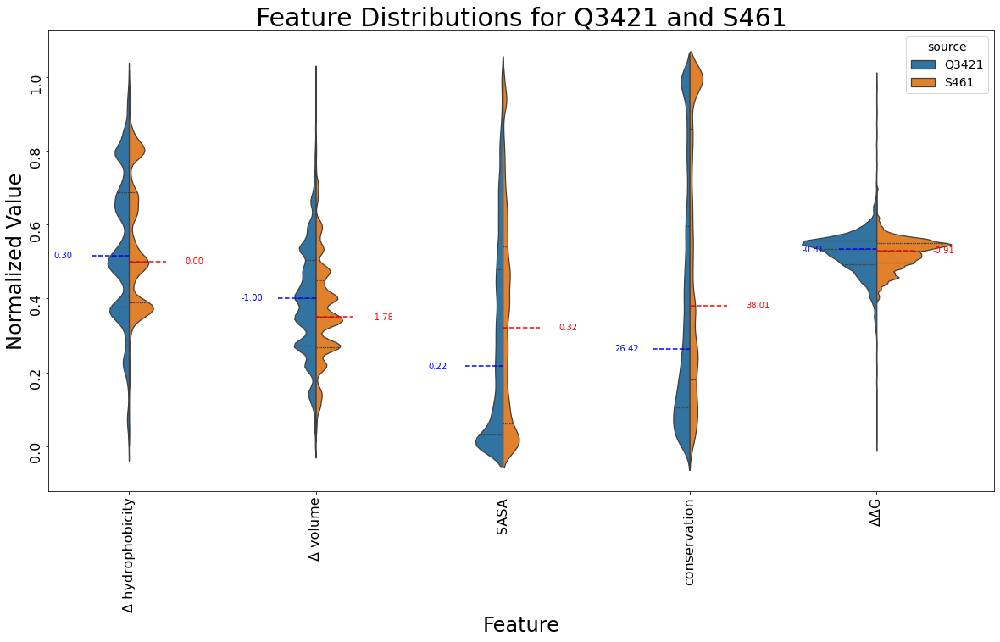

In [39]:
# SUPPLEMENTARY FIGURE 10

#s461_feats_ = s461_feats[['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG']]
compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])

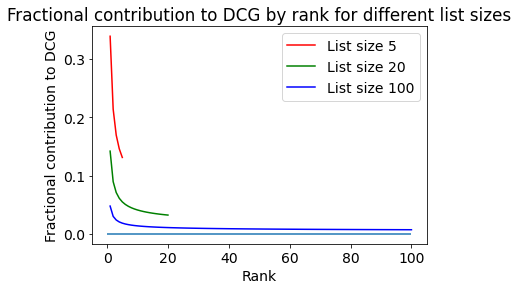

In [40]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()